In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path

In [2]:
# Paths to deduped parquet files
base_dir = Path("../data/Postings")

files = [
    base_dir / "SG-2022-WITHOUT-REPOSTS-W60D.parquet",
    base_dir / "SG-2023-WITHOUT-REPOSTS-W60D.parquet",
    base_dir / "SG-2024-WITHOUT-REPOSTS-W60D.parquet",
]

# Read and concatenate
data_df = pd.concat(
    [pd.read_parquet(f) for f in files],
    ignore_index=True
)

print("Combined data_df shape:", data_df.shape)
print("Years covered:", sorted(data_df["post_date"].dt.year.unique()))

Combined data_df shape: (1492675, 41)
Years covered: [2022, 2023, 2024]


In [3]:
recruitment_industries = [
    'Recruitment and Staffing Services',
    'Employment and Staffing Services',
    'Employment and Recruitment Services',
    'Human Resources and Recruitment Services',
    'Online Employment Platforms',
    'Human Resources and Workforce Solutions',
    'Business Process Outsourcing Services'
]

In [4]:
d_unique_filtered = data_df[~data_df['rics_k400'].isin(recruitment_industries)].copy()

In [12]:
import re

genai_keywords = [
    "copilot", "claude", "gemini", "large language model", "llm",
    "generative ai", "chatgpt", "gen ai", "gpt", "langchain", "rag",
    "retrieval-augmented generation", "vector embedding", "vector database",
    "transformer", "prompt engineering", "prompt design", "llamaindex",
    "pinecone", "weaviate", "milvus", "openai api", "anthropic",
    "azure openai", "vertex ai", "huggingface", "retrievalqa"
]

# Add word boundaries to avoid substring contamination
pattern = re.compile(
    r"\b(" + "|".join(re.escape(k) for k in genai_keywords) + r")\b",
    re.IGNORECASE
)

def build_flagged_set(
    d_unique: pd.DataFrame,
    title_col="jobtitle",
    desc_col="description",
    firm_col="company"
):
    d = d_unique.copy()

    d["title_text"] = d[title_col].fillna("").astype(str)
    d["desc_text"] = d[desc_col].fillna("").astype(str)

    # Extract matches separately
    d["title_matches"] = d["title_text"].apply(lambda x: pattern.findall(x))
    d["desc_matches"] = d["desc_text"].apply(lambda x: pattern.findall(x))

    # Combine matches
    d["matched_keywords"] = d.apply(
        lambda row: list(set(row["title_matches"] + row["desc_matches"])),
        axis=1
    )

    # Flag if any match exists
    d["keyword_flag"] = d["matched_keywords"].apply(lambda x: 1 if len(x) > 0 else 0)

    flagged = d[d["keyword_flag"] == 1].copy()

    print("Total flagged:", len(flagged))
    print("Example matched keywords distribution:")
    print(flagged["matched_keywords"].explode().value_counts().head(15))

    return flagged

In [14]:
len(d_unique_filtered)

997690

In [13]:
flagged = build_flagged_set(d_unique_filtered)

Total flagged: 4927
Example matched keywords distribution:
matched_keywords
LLM                     1559
Generative AI           1027
generative AI            863
transformer              458
ChatGPT                  424
Transformer              367
RAG                      350
GPT                      338
Gen AI                   310
prompt engineering       267
Large Language Model     145
large language model     139
Gemini                   135
LangChain                132
Claude                   119
Name: count, dtype: int64


In [15]:
flagged.to_csv("../data/Firm Level/flagged_genai_jobs.csv", index=False)

In [18]:
import os
import json
import time
import pandas as pd
import numpy as np
from openai import OpenAI

client = OpenAI()

# -----------------------------
# 1) LLM prompt + classifier (TITLE + DESCRIPTION + REASON)
# -----------------------------
SYSTEM_PROMPT = """
You are a classifier for job postings. Output ONLY compact JSON.

Role type definitions:
- integrator: builds/operates LLM systems (RAG, embeddings/vector DB, agents,
  LangChain/LlamaIndex, fine-tune/adapters, serving/inference, eval/guardrails,
  API integration).
- user: mainly uses LLM tools (ChatGPT, Gemini, Copilot, etc.) without building systems.
- both: does both integrator and user activities.
- none: neither.

Exclusions:
- Not integrator if only foundation-model research,
- Generic AI/ML roles,
- Developer roles at AI labs (e.g., OpenAI, DeepMind),
- Labeling/annotation roles.

Department (choose one):
- Technology
- Operations
- Marketing
- HR

Rules:
- If both integrator + user → role_type="both"
- Acronyms like "RAG" imply LLM context
- Prefer integrator=1 only when clear system-building signals appear
- JSON only; no prose

Output format:
{
  "integrator": 0|1,
  "user": 0|1,
  "role_type": "integrator"|"user"|"both"|"none",
  "department": "Technology"|"Operations"|"Marketing"|"HR",
  "confidence": 0.0-1.0,
  "reason": "short explanation"
}
"""


In [ ]:
def classify_posting_with_gpt(
    title: str,
    description: str,
    model: str = "gpt-4o",
    max_retries: int = 5
):
    t = "" if title is None else str(title)
    d = "" if description is None else str(description)

    user_content = f"Job Title:\n{t}\n\nJob Description:\n{d}"

    for attempt in range(max_retries):
        try:
            resp = client.chat.completions.create(
                model=model,
                messages=[
                    {"role": "system", "content": SYSTEM_PROMPT},
                    {"role": "user", "content": user_content}
                ],
                temperature=0,
                response_format={"type": "json_object"},
            )

            out = json.loads(resp.choices[0].message.content)
            return out

        except Exception as e:
            wait = min(2 ** attempt, 30)
            print(f"[WARN] GPT call failed (attempt {attempt+1}/{max_retries}): {e}")
            time.sleep(wait)

    return {
        "integrator": 0,
        "user": 0,
        "role_type": "none",
        "department": "Operations",
        "confidence": 0.0,
        "reason": "API failure"
    }

# -----------------------------
# 2) Test on sample (UPDATED: prints reason)
# -----------------------------
def test_gpt_on_sample(
    flagged_df: pd.DataFrame,
    n: int = 10,
    title_col: str = "jobtitle",
    firm_col: str = "company",
    date_col: str = "post_date",
    desc_col: str = "description",
    id_col: str = "job_id",
    model: str = "gpt-4o"
):
    sample = flagged_df.head(n).copy()

    print(f"\nTesting GPT on first {len(sample)} flagged postings...\n")
    print("=" * 80)

    for _, row in sample.iterrows():
        title = row.get(title_col, "N/A")
        description = row.get(desc_col, "")
        job_id = row.get(id_col, "N/A")
        company = row.get(firm_col, "N/A")
        post_date = row.get(date_col, "N/A")

        print(f"\nCompany: {company}")
        print(f"Job ID: {job_id}")
        print(f"Job Title: {title}")
        print(f"Post Date: {post_date}")
        print("-" * 80)
        print("Job Description:")
        print(description)
        print("-" * 80)

        out = classify_posting_with_gpt(title=title, description=description, model=model)

        print(f"GPT Classification (integrator): {out.get('integrator', 0)}")
        print(f"Role type: {out.get('role_type', 'N/A')}, User: {out.get('user', 0)}, Dept: {out.get('department', 'N/A')}, Conf: {out.get('confidence', 'N/A')}")
        print(f"Reason: {out['reason']}")
        print("=" * 80)

# Example:
# flagged = build_flagged_set(d_unique)
test_gpt_on_sample(flagged_df=flagged, n=10)


Testing GPT on first 10 flagged postings...


Company: Barghest Building Performance Pte Ltd.
Job ID: 14721160216
Job Title: central_engineer
Post Date: 2022-07-28 00:00:00
--------------------------------------------------------------------------------
Job Description:
Job Responsibilities
<br>. Drafting of panel layout, schematic and control drawing of starter and PLC panel.
<br>. Attend Factory Acceptance Test (FAT) of Starter and PLC panel.
<br>. Project testing and commissioning.
<br>. Attend to ad-hoc electrical issues at maintenance sites to troubleshoot/provide the findings report.
<br>. Contractor liaison, engagement/provide requirements.
<br><br>
Qualifications
<br>. Diploma in Electrical and/or Instrumentation & Control Engineering.
<br>. Past experiences in panel design, layout arrangement of starter panel and PLC panel.
<br>. Well versed in Singapore CP and Standards for panel design and eletrcial discipline.
<br>. Well versed with HVAC systems and knowledge on HVAC(ACMV)

In [ ]:
# -----------------------------
# 3) Run GPT on ALL flagged postings + print details + save + firm first-date list
# -----------------------------
def gpt_label_flagged_postings(
    flagged_df: pd.DataFrame,
    out_pred_csv: str = "flagged_postings_gpt_predictions.csv",
    out_firms_csv: str = "firms_ever_genai_integrator_first_date.csv",
    firm_col: str = "company",
    date_col: str = "post_date",
    title_col: str = "jobtitle",
    desc_col: str = "description",
    id_col: str = "job_id",
    model: str = "gpt-4o",
    sleep_s: float = 0.0,
    print_every: int = 1,   # set to 1 to print each posting like the sample; use 20/50 for less spam
):
    df = flagged_df.copy()

    # ensure required columns
    required = [firm_col, date_col, title_col, desc_col]
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise ValueError(f"Missing required columns in flagged_df: {missing}")

    # parse dates (needed for first integrator date)
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")

    # keep only needed columns early
    keep_cols = [c for c in [id_col, firm_col, date_col, title_col, desc_col] if c in df.columns]
    df = df[keep_cols].copy()

    print(f"Flagged postings to classify: {len(df):,}")
    print("Running GPT classification on title + description...")
    print("=" * 80)

    preds = []
    reasons = []
    role_types = []
    users = []
    departments = []
    confidences = []

    for k, (_, row) in enumerate(df.iterrows(), start=1):
        title = row.get(title_col, "")
        description = row.get(desc_col, "")
        job_id = row.get(id_col, "N/A")
        company = row.get(firm_col, "N/A")
        post_date = row.get(date_col, "N/A")

        # Print like the sample (but controllable)
        if print_every and (k % print_every == 0):
            print(f"\nCompany: {company}")
            print(f"Job ID: {job_id}")
            print(f"Job Title: {title}")
            print(f"Post Date: {post_date}")
            print("-" * 80)
            print("Job Description:")
            print(description)
            print("-" * 80)

        out = classify_posting_with_gpt(
            title=title,
            description=description,
            model=model
        )

        integrator = int(out.get("integrator", 0))
        reason = str(out.get("reason", "")).strip()

        preds.append(integrator)
        reasons.append(reason)
        role_types.append(out.get("role_type", "none"))
        users.append(int(out.get("user", 0)))
        departments.append(out.get("department", "Operations"))
        confidences.append(float(out.get("confidence", 0.0)) if out.get("confidence", None) is not None else 0.0)

        if print_every and (k % print_every == 0):
            print(f"GPT Classification (integrator): {integrator}")
            print(f"Role type: {role_types[-1]}, User: {users[-1]}, Dept: {departments[-1]}, Conf: {confidences[-1]}")
            print(f"Reason: {reason}")
            print("=" * 80)

        if sleep_s > 0:
            time.sleep(sleep_s)

        if k % 50 == 0:
            print(f"  - Classified {k:,}/{len(df):,}")

    df["is_integrator_gpt"] = preds
    df["gpt_reason"] = reasons
    df["gpt_role_type"] = role_types
    df["gpt_user"] = users
    df["gpt_department"] = departments
    df["gpt_confidence"] = confidences

    # save posting-level predictions
    df.to_csv(out_pred_csv, index=False)
    print(f"\nSaved posting-level predictions -> {out_pred_csv}")

    # --------------------------------------------------
    # Firm-level list: ever integrator + FIRST date
    # --------------------------------------------------
    integrator_only = df[df["is_integrator_gpt"] == 1].copy()

    if integrator_only.empty:
        firms = pd.DataFrame(columns=[firm_col, "first_integrator_post_date", "n_integrator_postings"])
        firms.to_csv(out_firms_csv, index=False)
        print("No integrator postings found by GPT. Saved empty firm list.")
        return df, firms

    firms = (
        integrator_only
        .dropna(subset=[firm_col, date_col])
        .groupby(firm_col, as_index=False)
        .agg(
            first_integrator_post_date=(date_col, "min"),
            n_integrator_postings=("is_integrator_gpt", "sum"),
        )
        .sort_values("first_integrator_post_date")
    )

    firms.to_csv(out_firms_csv, index=False)
    print(f"Saved firm-level ever-integrator list -> {out_firms_csv}")

    # reporting
    n_unique_firms_flagged = df[firm_col].nunique(dropna=True)
    n_unique_firms_treated = firms[firm_col].nunique(dropna=True)
    pct_firms_treated_among_flagged = (n_unique_firms_treated / n_unique_firms_flagged) if n_unique_firms_flagged else np.nan

    print("----- Summary -----")
    print(f"Unique firms in flagged set: {n_unique_firms_flagged:,}")
    print(f"Unique firms ever integrator (GPT integrator=1): {n_unique_firms_treated:,} ({pct_firms_treated_among_flagged:.2%} of flagged firms)")
    print(f"Integrator postings (GPT integrator=1): {int(df['is_integrator_gpt'].sum()):,} / {len(df):,} ({df['is_integrator_gpt'].mean():.2%})")

    return df, firms

# -----------------------------
# Example run (prints every posting; set print_every=50 if too verbose)
# -----------------------------
postings_pred_df, firms_first_df = gpt_label_flagged_postings(
    flagged_df=flagged,
    out_pred_csv="flagged_postings_gpt_predictions.csv",
    out_firms_csv="firms_ever_genai_integrator_first_date.csv",
    firm_col="company",
    date_col="post_date",
    title_col="jobtitle",
    desc_col="description",
    id_col="job_id",
    model="gpt-4o",
    sleep_s=0.1,
    print_every=1
)

Flagged postings to classify: 4,927
Running GPT classification on title + description...

Company: Barghest Building Performance Pte Ltd.
Job ID: 14721160216
Job Title: central_engineer
Post Date: 2022-07-28 00:00:00
--------------------------------------------------------------------------------
Job Description:
Job Responsibilities
<br>. Drafting of panel layout, schematic and control drawing of starter and PLC panel.
<br>. Attend Factory Acceptance Test (FAT) of Starter and PLC panel.
<br>. Project testing and commissioning.
<br>. Attend to ad-hoc electrical issues at maintenance sites to troubleshoot/provide the findings report.
<br>. Contractor liaison, engagement/provide requirements.
<br><br>
Qualifications
<br>. Diploma in Electrical and/or Instrumentation & Control Engineering.
<br>. Past experiences in panel design, layout arrangement of starter panel and PLC panel.
<br>. Well versed in Singapore CP and Standards for panel design and eletrcial discipline.
<br>. Well versed wi

In [3]:
import os
import glob
import pandas as pd
import numpy as np

def build_positions_panel_from_ever_treated_firms(
    firms_first_df: pd.DataFrame,
    postings_pred_df: pd.DataFrame,  # <-- NEW: posting-level GPT preds
    positions_dir: str = r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\Positions",
    company_positions_filename: str = "company_positions.csv",
    # ---- positions schema
    pos_date_col: str = "startdate",
    pos_id_col: str = "position_id",
    cp_join_col: str = "position_id",
    cp_company_col: str = "company_name",
    # ---- firm list schema
    firms_company_col: str = "company",
    firms_first_date_col: str = "first_integrator_post_date",
    # ---- postings preds schema
    postings_company_col: str = "company",
    postings_date_col: str = "post_date",
    postings_integrator_col: str = "is_integrator_gpt",
    # ---- panel window + post indicator
    panel_min_qtr: str = "2022Q1",
    panel_max_qtr: str = "2024Q4",
    treat_qtr: str = "2022Q4",
    out_path: str = "firm_quarter_positions_panel_treated_by_gpt_integrator_post_2022Q4on_2022Q1_2024Q4.dta",
):
    TREAT_QTR = pd.Period(treat_qtr, freq="Q")

    print("A) Building treated firms as: has >=1 integrator posting in/after treat_qtr...")

    # basic checks
    need_cols = [postings_company_col, postings_date_col, postings_integrator_col]
    missing = [c for c in need_cols if c not in postings_pred_df.columns]
    if missing:
        raise ValueError(f"postings_pred_df missing columns: {missing}. Found: {list(postings_pred_df.columns)}")

    p = postings_pred_df.copy()
    p[postings_date_col] = pd.to_datetime(p[postings_date_col], errors="coerce")
    p = p.dropna(subset=[postings_date_col, postings_company_col]).copy()
    p["qtr"] = p[postings_date_col].dt.to_period("Q")

    # integrator postings only
    p = p[p[postings_integrator_col].astype(int) == 1].copy()

    # treated firms = any integrator posting >= treat_qtr
    treated_firms = set(
        p.loc[p["qtr"] >= TREAT_QTR, postings_company_col].astype(str).unique().tolist()
    )

    print(f"  - Treated firms (integrator posting >= {treat_qtr}): {len(treated_firms):,}")

    # keep firms_first_df for optional merge of first date (info only)
    treated_firms_df = firms_first_df.copy()
    if firms_company_col in treated_firms_df.columns:
        treated_firms_df[firms_company_col] = treated_firms_df[firms_company_col].astype(str)
    if firms_first_date_col in treated_firms_df.columns:
        treated_firms_df[firms_first_date_col] = pd.to_datetime(treated_firms_df[firms_first_date_col], errors="coerce")

    # ==================================================
    # B) Load positions files + merge company_positions
    # ==================================================
    print("\nB) Loading positions files and merging company_positions.csv...")

    company_positions_path = os.path.join(positions_dir, company_positions_filename)
    if not os.path.exists(company_positions_path):
        raise FileNotFoundError(f"Missing company_positions.csv at: {company_positions_path}")

    cp = pd.read_csv(company_positions_path)

    required_cp_cols = {cp_join_col, cp_company_col}
    missing_cp = required_cp_cols - set(cp.columns)
    if missing_cp:
        raise ValueError(f"company_positions.csv missing required columns: {missing_cp}. Found columns: {list(cp.columns)[:30]}")

    files_2022_2024 = (
        sorted(glob.glob(os.path.join(positions_dir, "2022Q*_positions.csv")))
        + sorted(glob.glob(os.path.join(positions_dir, "2023Q*_positions.csv")))
        + sorted(glob.glob(os.path.join(positions_dir, "2024Q*_positions.csv")))
    )
    pos_files = files_2022_2024

    if len(pos_files) == 0:
        raise FileNotFoundError(f"No position files found in {positions_dir} with expected patterns (2022-2024).")

    print(f"  - Found {len(pos_files)} positions files (2022-2024 only)")
    print(f"  - First 3 files: {[os.path.basename(x) for x in pos_files[:3]]}")

    pos_list = []
    for fp in pos_files:
        tmp = pd.read_csv(fp)
        tmp["_source_file"] = os.path.basename(fp)
        pos_list.append(tmp)

    pos = pd.concat(pos_list, ignore_index=True)
    print(f"  - Loaded positions rows (raw concat): {len(pos):,}")

    required_pos_cols = {pos_id_col, pos_date_col}
    missing_pos = required_pos_cols - set(pos.columns)
    if missing_pos:
        raise ValueError(f"Positions files missing required columns: {missing_pos}. Found columns: {list(pos.columns)[:30]}")

    pos[pos_id_col] = pos[pos_id_col].astype(str)
    cp[cp_join_col] = cp[cp_join_col].astype(str)

    cp_small = cp[[cp_join_col, cp_company_col]].drop_duplicates()

    pos = pos.merge(
        cp_small,
        left_on=pos_id_col,
        right_on=cp_join_col,
        how="left",
        validate="m:1"
    )

    pos = pos.rename(columns={cp_company_col: "company"})
    pos["company"] = pos["company"].astype(str)

    pos[pos_date_col] = pd.to_datetime(pos[pos_date_col], errors="coerce")
    before_dates = len(pos)
    pos = pos.dropna(subset=[pos_date_col]).copy()
    print(f"  - Dropped rows with invalid startdate: {before_dates - len(pos):,}")

    pos["qtr"] = pos[pos_date_col].dt.to_period("Q")
    panel_min = pd.Period(panel_min_qtr, freq="Q")
    panel_max = pd.Period(panel_max_qtr, freq="Q")

    before_window = len(pos)
    pos = pos[(pos["qtr"] >= panel_min) & (pos["qtr"] <= panel_max)].copy()
    print(f"  - Positions rows after quarter window [{panel_min_qtr}, {panel_max_qtr}]: {len(pos):,} (removed {before_window - len(pos):,})")

    # ==================================================
    # C) Aggregate + balance
    # ==================================================
    print("\nC) Aggregating to firm-quarter and balancing panel...")

    panel = (
        pos.groupby(["company", "qtr"])
        .agg(num_positions=(pos_id_col, "nunique"))
        .reset_index()
    )

    firms_in_positions = panel[["company"]].drop_duplicates()
    all_qtrs = pd.period_range(panel_min, panel_max, freq="Q")
    full = firms_in_positions.assign(_tmp=1).merge(pd.DataFrame({"qtr": all_qtrs, "_tmp": 1}), on="_tmp").drop(columns="_tmp")

    panel = full.merge(panel, on=["company", "qtr"], how="left")
    panel["num_positions"] = panel["num_positions"].fillna(0).astype(int)

    # ==================================================
    # D) Treatment + post
    # ==================================================
    print("\nD) Assigning treated and post indicators...")

    panel["treated"] = panel["company"].astype(str).isin(treated_firms).astype(int)

    n_firms_positions = panel[["company", "treated"]].drop_duplicates().shape[0]
    n_treated_positions = int(panel[["company", "treated"]].drop_duplicates()["treated"].sum())
    pct_treated_positions_firms = (n_treated_positions / n_firms_positions) if n_firms_positions > 0 else np.nan
    print(f"  - Treated firms (positions panel): {n_treated_positions:,} / {n_firms_positions:,} ({pct_treated_positions_firms:.2%})")

    panel["post"] = (panel["qtr"] >= TREAT_QTR).astype(int)
    panel["did"] = panel["treated"] * panel["post"]
    panel["log_positions"] = np.log(panel["num_positions"] + 1)

    # optional: merge first integrator date (info only)
    if firms_first_date_col in treated_firms_df.columns and firms_company_col in treated_firms_df.columns:
        first_map = treated_firms_df[[firms_company_col, firms_first_date_col]].drop_duplicates()
        first_map = first_map.rename(columns={firms_company_col: "company"})
        panel = panel.merge(first_map, on="company", how="left")

    # Stata-aligned time vars
    panel["year"] = panel["qtr"].dt.year
    panel["qtr_num"] = panel["qtr"].dt.quarter
    panel["tq"] = (panel["year"] - 1960) * 4 + (panel["qtr_num"] - 1)
    panel["firm_id"] = panel["company"].astype("category").cat.codes + 1
    panel["qtr_str"] = panel["qtr"].astype(str)

    panel = panel.drop(columns="qtr").sort_values(["firm_id", "year", "qtr_num"])

    # save
    panel.to_stata(out_path, write_index=False, version=118)
    print("\nE) Saved outputs")
    print(f"  - Saved positions panel: {out_path}")
    print(f"  - Post starts at: {treat_qtr} (inclusive)")
    print(f"  - Treatment: treated = 1 if firm has ANY integrator posting >= {treat_qtr}")

    return panel, treated_firms

In [4]:
post1 = pd.read_csv("../data/flagged_postings_gpt_predictions.csv")
post2 = pd.read_csv("../data/flagged_postings_gpt_predictions_2021Sep_Dec.csv")
postings_pred_df = pd.concat([post1, post2], ignore_index=True)

firms_first_df = pd.read_csv("../data/firms_ever_genai_integrator_first_date.csv")

panel, treated_firms = build_positions_panel_from_ever_treated_firms(
    firms_first_df=firms_first_df,
    postings_pred_df=postings_pred_df,
    out_path="../data/Positions/firm_quarter_positions_panel_treated_by_gpt_integrator_post_2022Q4on_2022Q1_2024Q4.dta"
)

A) Building treated firms as: has >=1 integrator posting in/after treat_qtr...
  - Treated firms (integrator posting >= 2022Q4): 358

B) Loading positions files and merging company_positions.csv...
  - Found 12 positions files (2022-2024 only)
  - First 3 files: ['2022Q1_positions.csv', '2022Q2_positions.csv', '2022Q3_positions.csv']
  - Loaded positions rows (raw concat): 3,021,135
  - Dropped rows with invalid startdate: 0
  - Positions rows after quarter window [2022Q1, 2024Q4]: 1,384,172 (removed 1,636,963)

C) Aggregating to firm-quarter and balancing panel...

D) Assigning treated and post indicators...
  - Treated firms (positions panel): 287 / 93,073 (0.31%)

E) Saved outputs
  - Saved positions panel: ../data/Positions/firm_quarter_positions_panel_treated_by_gpt_integrator_post_2022Q4on_2022Q1_2024Q4.dta
  - Post starts at: 2022Q4 (inclusive)
  - Treatment: treated = 1 if firm has ANY integrator posting >= 2022Q4


In [5]:
pre_panel = panel[panel['post'] == 0]

C:\Users\teomi\AppData\Local\Temp\ipykernel_13084\3511332671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_panel["log_positions"] = np.log(pre_panel["num_positions"] + 1)


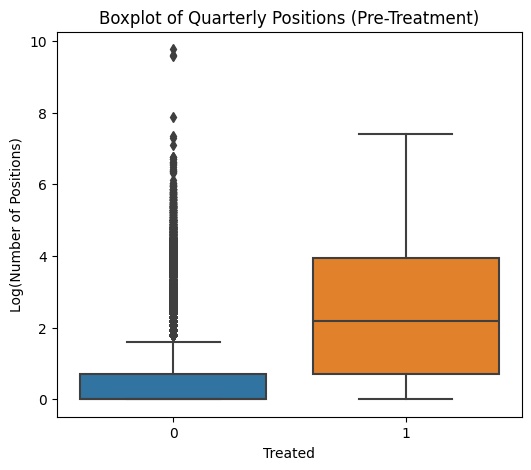

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

pre_panel["log_positions"] = np.log(pre_panel["num_positions"] + 1)

plt.figure(figsize=(6,5))

sns.boxplot(
    data=pre_panel,
    x="treated",
    y="log_positions"
)

plt.title("Boxplot of Quarterly Positions (Pre-Treatment)")
plt.xlabel("Treated")
plt.ylabel("Log(Number of Positions)")
plt.show()

Using STOCK OF EMPLOYEES instead of NEW HIRES


ACTIVE threshold: ≥5 hires (between 2021-01-01 and 2025-04-01)
Panel window: 2022Q1 to 2025Q2
Firms kept: 27,452
Treated firms kept: 268
Control firms kept: 27,184
Treated share among kept firms: 0.98%


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

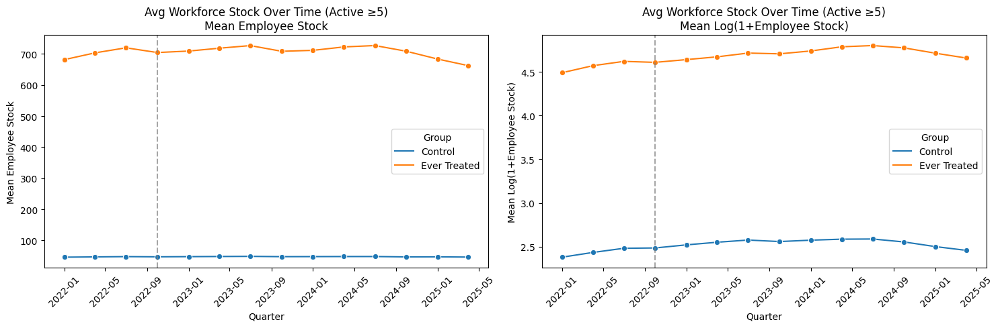

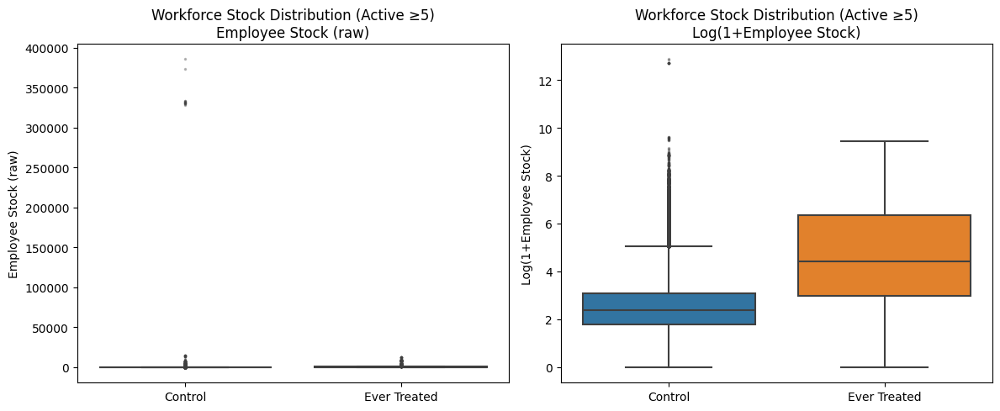

Saved panel: ../data/Positions/firm_quarter_stock_active_ge5_to2025Q2.dta | Rows: 384,328

ACTIVE threshold: ≥10 hires (between 2021-01-01 and 2025-04-01)
Panel window: 2022Q1 to 2025Q2
Firms kept: 16,353
Treated firms kept: 246
Control firms kept: 16,107
Treated share among kept firms: 1.50%


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

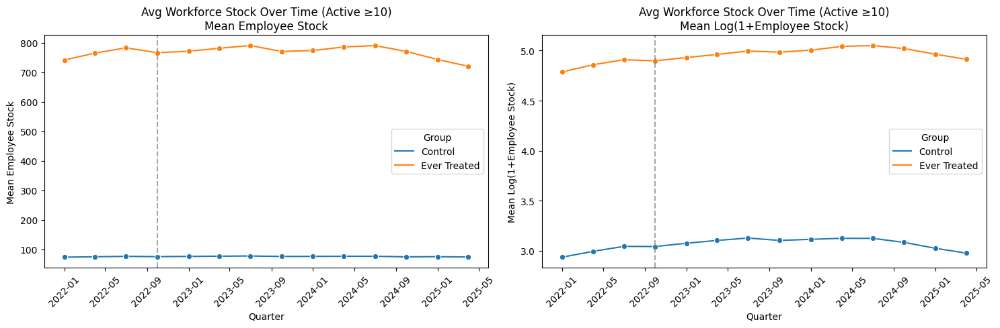

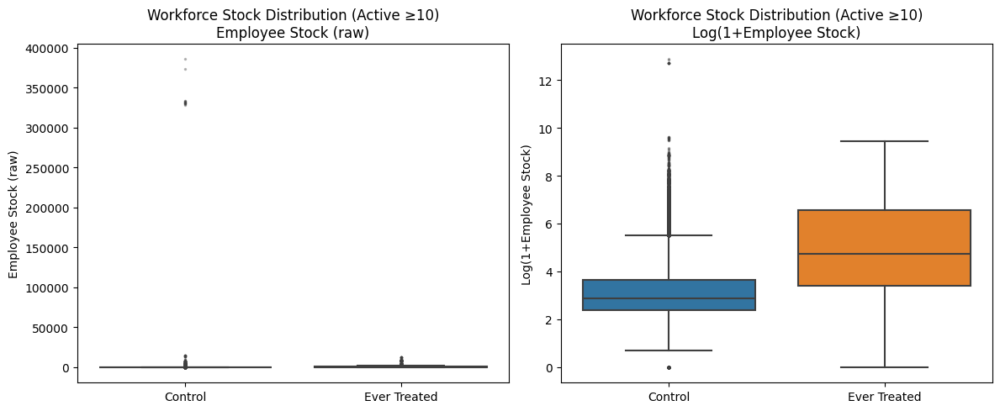

Saved panel: ../data/Positions/firm_quarter_stock_active_ge10_to2025Q2.dta | Rows: 228,942

ACTIVE threshold: ≥15 hires (between 2021-01-01 and 2025-04-01)
Panel window: 2022Q1 to 2025Q2
Firms kept: 11,788
Treated firms kept: 235
Control firms kept: 11,553
Treated share among kept firms: 1.99%


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

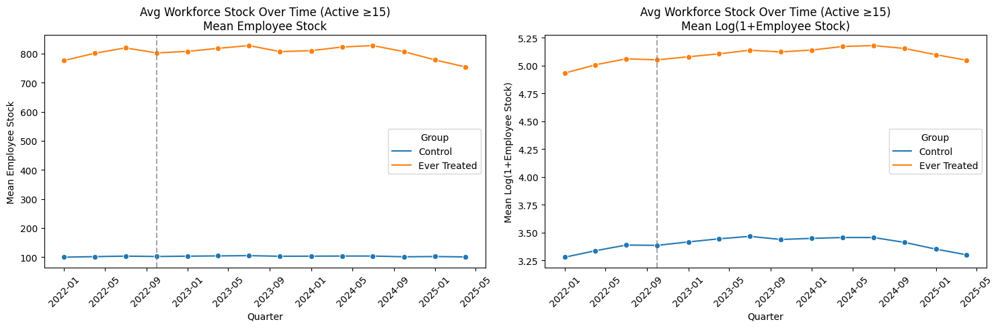

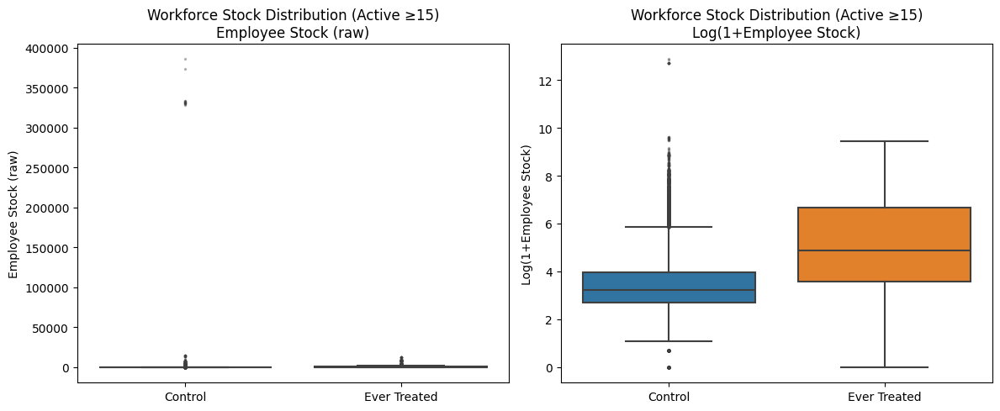

Saved panel: ../data/Positions/firm_quarter_stock_active_ge15_to2025Q2.dta | Rows: 165,032

ACTIVE threshold: ≥20 hires (between 2021-01-01 and 2025-04-01)
Panel window: 2022Q1 to 2025Q2
Firms kept: 9,084
Treated firms kept: 221
Control firms kept: 8,863
Treated share among kept firms: 2.43%


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

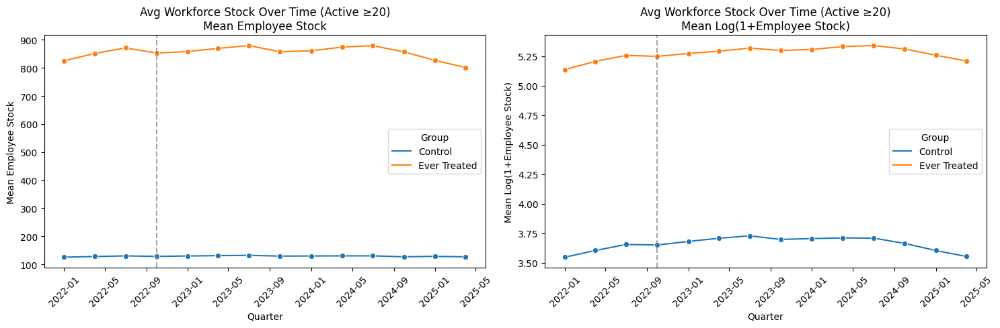

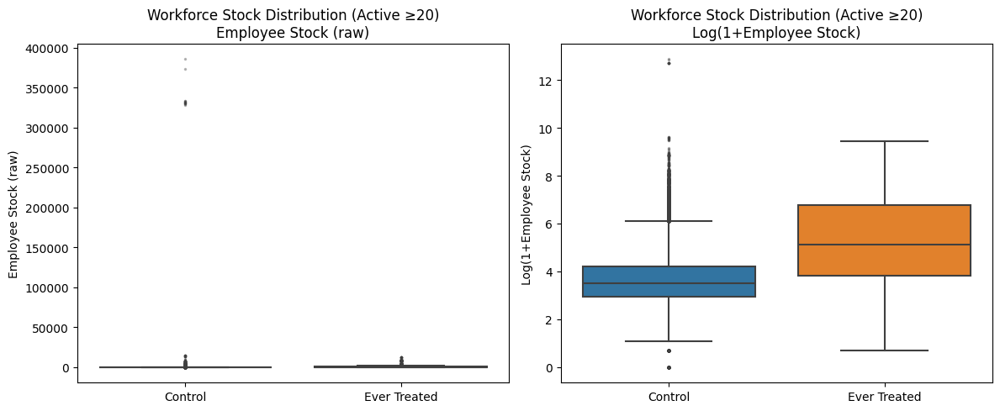

Saved panel: ../data/Positions/firm_quarter_stock_active_ge20_to2025Q2.dta | Rows: 127,176


In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import subprocess, sys

# pip install pyreadstat if not already installed
try:
    import pyreadstat
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "pyreadstat", "-q"])
    import pyreadstat


def build_stock_panel_for_threshold(
    positions_path=r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\Positions\positions_stock.csv",
    positions_2025_path=r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\Positions\2025_positions.csv",
    post1_path="../data/flagged_postings_gpt_predictions.csv",
    post2_path="../data/flagged_postings_gpt_predictions_2021Sep_Dec.csv",
    out_path_template="../data/Positions/firm_quarter_stock_active_ge{thr}_to2025Q2.dta",
    active_threshold=5,
    hire_window_start="2021-01-01",
    hire_window_end="2025-04-01",
    treated_start="2021-09-01",
    treated_end="2025-07-01",          # include through 2025Q2
    panel_start_q="2022Q1",
    panel_end_q="2025Q2",              # extend panel to 2025Q2
    treat_q="2022Q4",
    recruitment_industries=None,
    make_plots=True,
):
    if recruitment_industries is None:
        recruitment_industries = [
            'Recruitment and Staffing Services',
            'Employment and Staffing Services',
            'Employment and Recruitment Services',
            'Human Resources and Recruitment Services',
            'Online Employment Platforms',
            'Human Resources and Workforce Solutions',
            'Business Process Outsourcing Services'
        ]

    # ---------------------------
    # 1) Load data (positions_stock + 2025_positions)
    # ---------------------------
    pos_main = pd.read_csv(positions_path)
    pos_2025 = pd.read_csv(positions_2025_path)
    positions = pd.concat([pos_main, pos_2025], ignore_index=True)

    post1 = pd.read_csv(post1_path)
    post2 = pd.read_csv(post2_path)
    postings_pred_df = pd.concat([post1, post2], ignore_index=True)

    # ---------------------------
    # 2) Ever-treated firms
    # ---------------------------
    postings_pred_df["post_date"] = pd.to_datetime(postings_pred_df["post_date"], errors="coerce")
    postings_pred_df["is_integrator_gpt"] = postings_pred_df["is_integrator_gpt"].astype(int)

    treated_firms = set(
        postings_pred_df[
            (postings_pred_df["is_integrator_gpt"] == 1) &
            (postings_pred_df["post_date"] >= treated_start) &
            (postings_pred_df["post_date"] < treated_end)
        ]["company"].astype(str).str.strip().str.lower().unique()
    )

    # ---------------------------
    # 3) Prepare positions + filters
    # ---------------------------
    positions["startdate"] = pd.to_datetime(positions["startdate"], errors="coerce")
    positions["enddate"] = pd.to_datetime(positions["enddate"], errors="coerce")
    positions["company_name"] = positions["company_name"].astype(str).str.strip().str.lower()
    positions = positions.dropna(subset=["company_name", "startdate", "user_id"])

    # Exclude recruitment / intermediaries (drop entire firm if any row hits those industries)
    if "rics_k400" not in positions.columns:
        raise ValueError("Column 'rics_k400' not found in positions dataset.")
    bad_firms = positions.loc[positions["rics_k400"].isin(recruitment_industries), "company_name"].unique()
    positions = positions[~positions["company_name"].isin(bad_firms)].copy()

    # ---------------------------
    # 4) Define ACTIVE firms by hires in [2021-01-01, 2025-04-01)
    # ---------------------------
    firm_hires = (
        positions[
            (positions["startdate"] >= hire_window_start) &
            (positions["startdate"] < hire_window_end)
        ]
        .groupby("company_name")["user_id"]
        .nunique()
        .reset_index(name="total_hires_2021_2025")
    )

    active_firms = set(
        firm_hires.loc[firm_hires["total_hires_2021_2025"] >= active_threshold, "company_name"]
    )
    positions = positions[positions["company_name"].isin(active_firms)].copy()

    # ---------------------------
    # 5) Build quarterly STOCK panel (balanced)
    # ---------------------------
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")

    stock_list = []
    for q in quarters:
        q_start = q.start_time
        q_end = q.end_time

        active = positions[
            (positions["startdate"] <= q_end) &
            (positions["enddate"].isna() | (positions["enddate"] >= q_start))
        ]

        stock = (
            active.groupby("company_name")["user_id"]
            .nunique()
            .reset_index()
            .rename(columns={"user_id": "stock_employees"})
        )
        stock["quarter"] = q
        stock_list.append(stock)

    stock_panel = pd.concat(stock_list, ignore_index=True)

    # Balance panel
    all_firms = positions[["company_name"]].drop_duplicates()
    all_q = pd.DataFrame({"quarter": quarters})
    all_firms["_tmp"] = 1
    all_q["_tmp"] = 1
    full = all_firms.merge(all_q, on="_tmp").drop(columns="_tmp")

    stock_panel = full.merge(stock_panel, on=["company_name", "quarter"], how="left")
    stock_panel["stock_employees"] = stock_panel["stock_employees"].fillna(0).astype(int)

    # ---------------------------
    # 6) Treatment + time vars
    # ---------------------------
    stock_panel["treated"] = stock_panel["company_name"].isin(treated_firms).astype(int)
    stock_panel["Treatment"] = stock_panel["treated"].map({0: "Control", 1: "Ever Treated"})
    stock_panel["quarter_date"] = stock_panel["quarter"].dt.to_timestamp()
    stock_panel["log_stock"] = np.log1p(stock_panel["stock_employees"])

    stock_panel["firm_id"] = stock_panel["company_name"].astype("category").cat.codes + 1
    stata_epoch = pd.Period("1960Q1", freq="Q")
    stock_panel["tq"] = stock_panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()

    # ---------------------------
    # 7) Summary prints
    # ---------------------------
    treated_share = stock_panel[["company_name", "treated"]].drop_duplicates()["treated"].mean()
    print("\n" + "=" * 80)
    print(f"ACTIVE threshold: ≥{active_threshold} hires (between {hire_window_start} and {hire_window_end})")
    print(f"Panel window: {panel_start_q} to {panel_end_q}")
    print(f"Firms kept: {stock_panel['company_name'].nunique():,}")
    print(f"Treated firms kept: {stock_panel.loc[stock_panel['treated']==1,'company_name'].nunique():,}")
    print(f"Control firms kept: {stock_panel.loc[stock_panel['treated']==0,'company_name'].nunique():,}")
    print(f"Treated share among kept firms: {treated_share:.2%}")

    # ---------------------------
    # 8) Plots (optional)
    # ---------------------------
    if make_plots:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))

        for ax, col, ylabel in zip(
            axes,
            ["stock_employees", "log_stock"],
            ["Mean Employee Stock", "Mean Log(1+Employee Stock)"]
        ):
            plot_data = (
                stock_panel
                .groupby(["quarter_date", "Treatment"])[col]
                .mean()
                .reset_index()
            )
            sns.lineplot(data=plot_data, x="quarter_date", y=col,
                         hue="Treatment", marker="o", ax=ax)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"Avg Workforce Stock Over Time (Active ≥{active_threshold})\n{ylabel}")
            ax.set_xlabel("Quarter")
            ax.set_ylabel(ylabel)
            ax.tick_params(axis="x", rotation=45)
            ax.legend(title="Group")

        plt.tight_layout()
        plt.show()

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        for ax, col, ylabel in zip(
            axes,
            ["stock_employees", "log_stock"],
            ["Employee Stock (raw)", "Log(1+Employee Stock)"]
        ):
            sns.boxplot(
                data=stock_panel, x="Treatment", y=col,
                order=["Control", "Ever Treated"], ax=ax,
                flierprops=dict(marker=".", alpha=0.3, markersize=3)
            )
            ax.set_title(f"Workforce Stock Distribution (Active ≥{active_threshold})\n{ylabel}")
            ax.set_xlabel("")
            ax.set_ylabel(ylabel)

        plt.tight_layout()
        plt.show()

    # ---------------------------
    # 9) Save to Stata
    # ---------------------------
    stata_df = stock_panel[[
        "firm_id",
        "company_name",
        "tq",
        "stock_employees",
        "log_stock",
        "treated"
    ]].copy()

    stata_df["firm_id"] = stata_df["firm_id"].astype(int)
    stata_df["tq"] = stata_df["tq"].astype(int)
    stata_df["stock_employees"] = stata_df["stock_employees"].astype(float)
    stata_df["log_stock"] = stata_df["log_stock"].astype(float)
    stata_df["treated"] = stata_df["treated"].astype(int)

    out_path = out_path_template.format(thr=active_threshold)
    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved panel: {out_path} | Rows: {len(stata_df):,}")

    return stock_panel, stata_df


# -------------------------------------------------
# Run for multiple thresholds
# -------------------------------------------------
thresholds_to_test = [5, 10, 15, 20]

results = {}
for thr in thresholds_to_test:
    stock_panel, stata_df = build_stock_panel_for_threshold(
        active_threshold=thr,
        make_plots=True
    )
    results[thr] = stock_panel

Separate DiD for Junior/Senior Workers

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

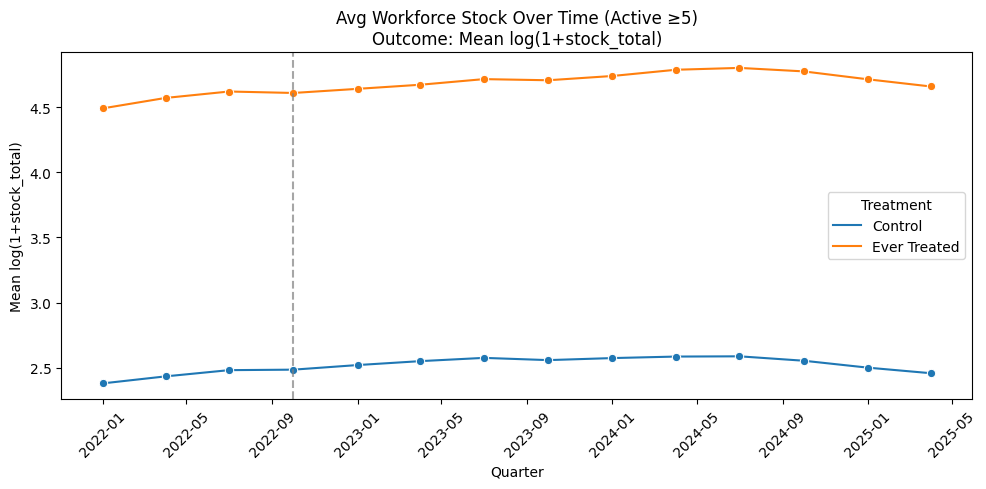

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

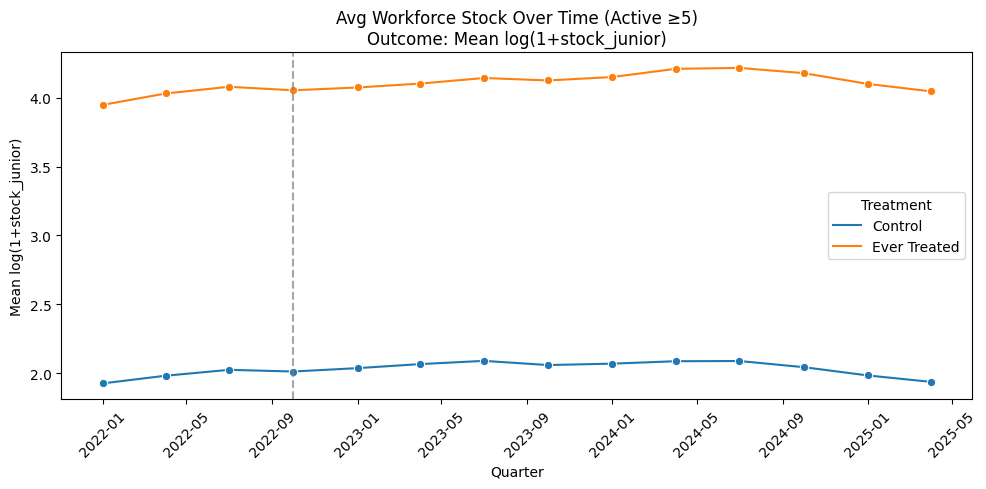

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

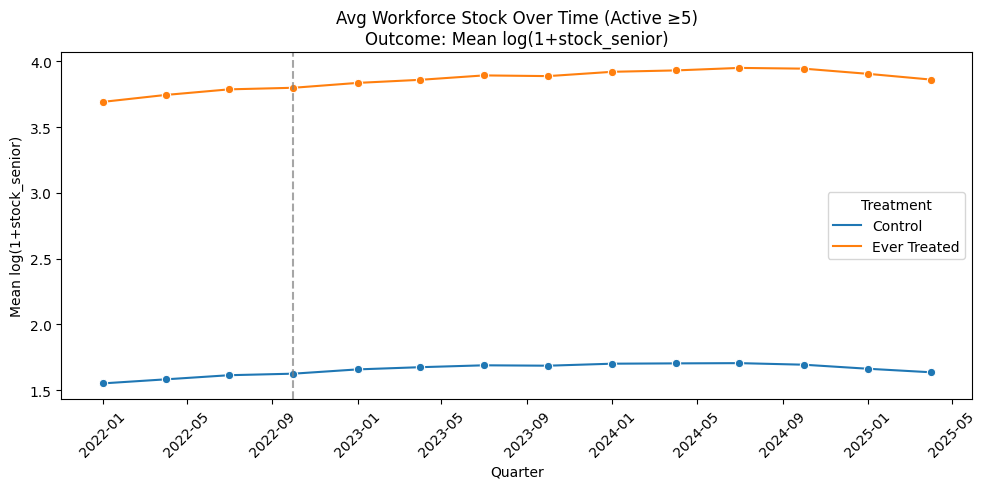

Saved panel: ../data/Positions/firm_quarter_stock_active_ge5_to2025Q2_with_seniority.dta | Rows: 384,328 | Firms: 27,452


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

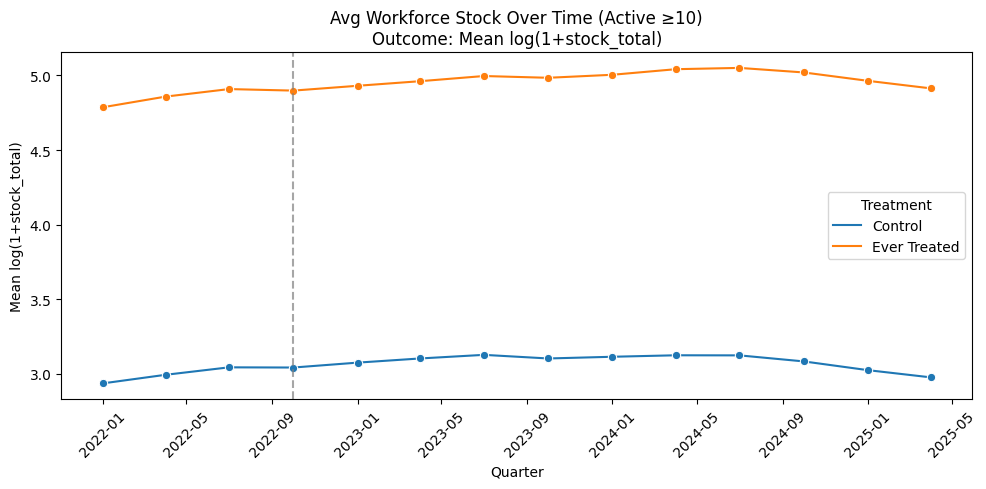

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

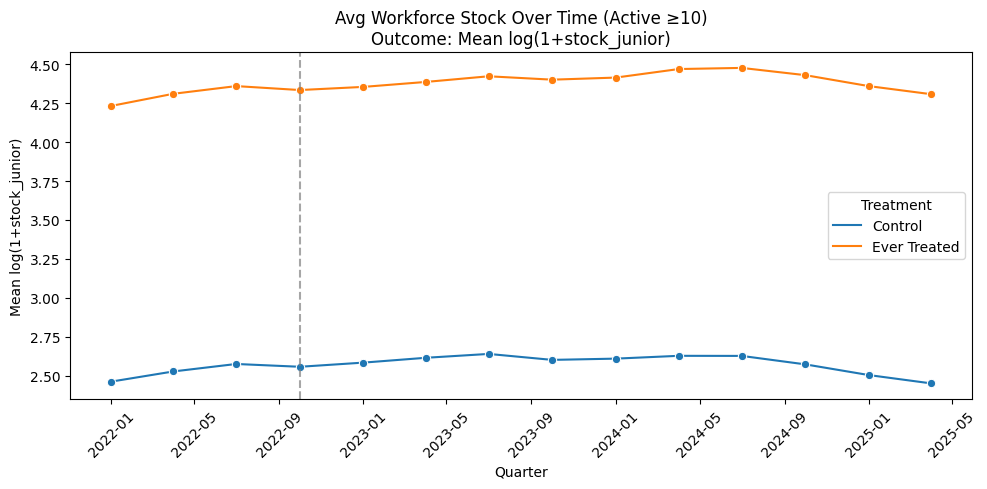

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

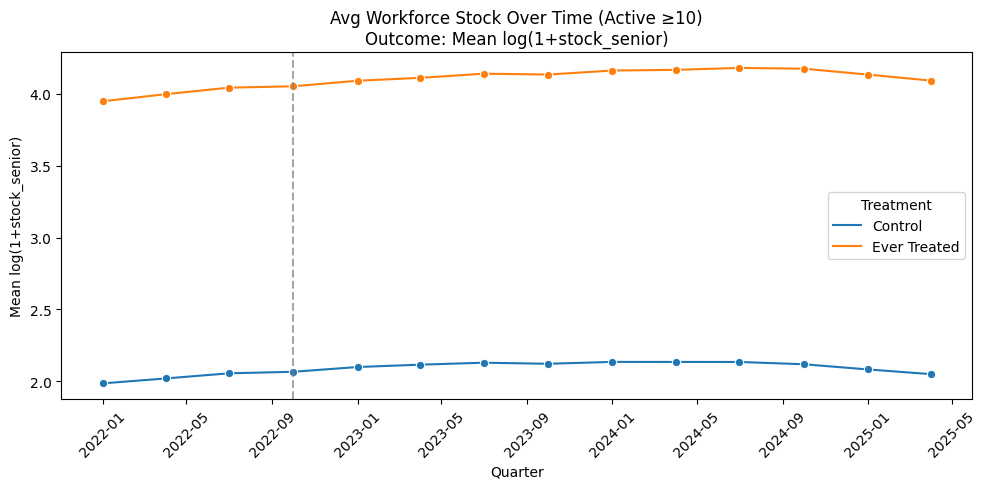

Saved panel: ../data/Positions/firm_quarter_stock_active_ge10_to2025Q2_with_seniority.dta | Rows: 228,942 | Firms: 16,353


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

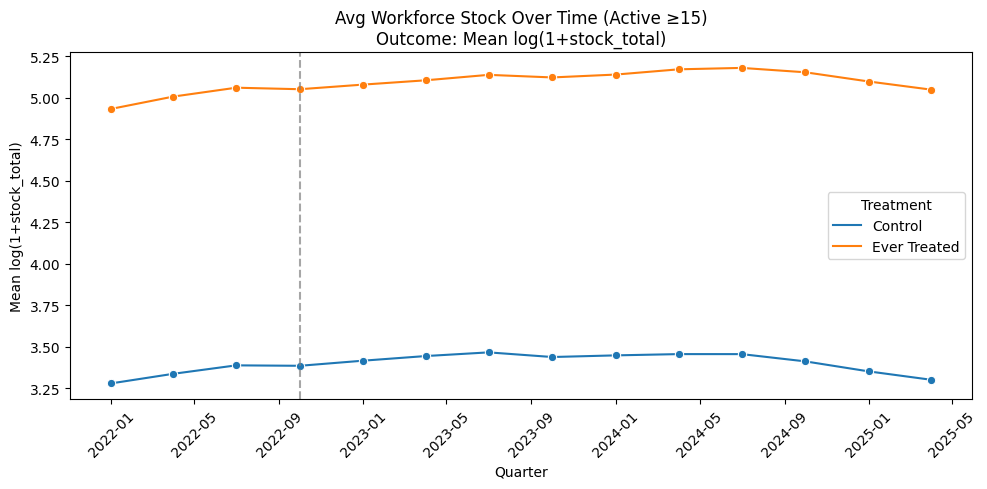

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

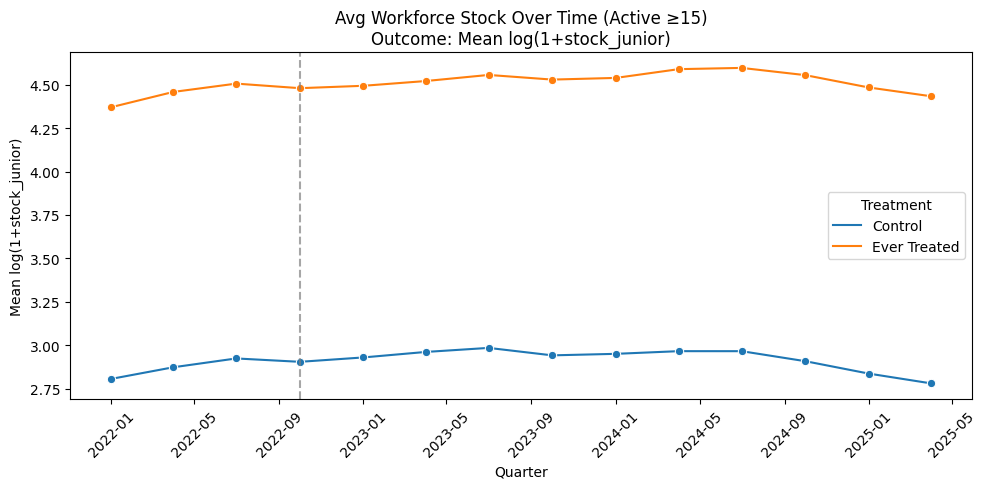

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

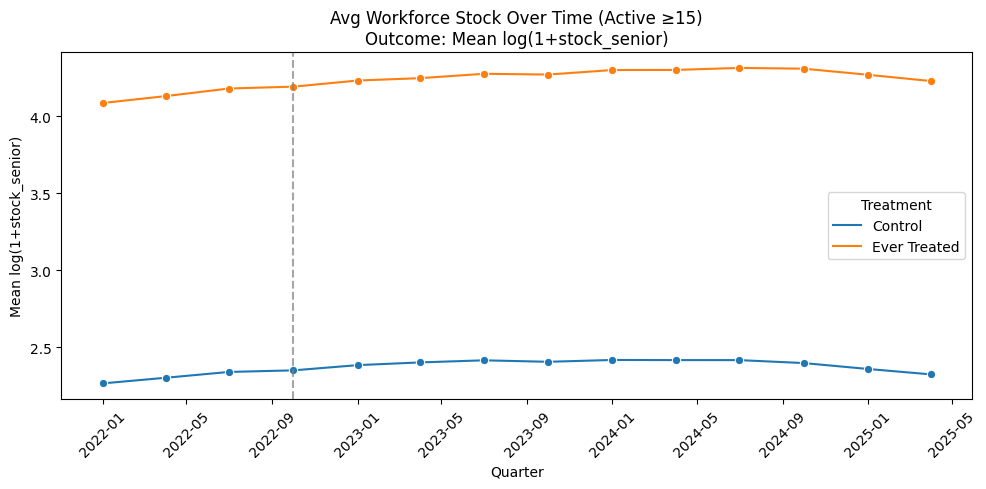

Saved panel: ../data/Positions/firm_quarter_stock_active_ge15_to2025Q2_with_seniority.dta | Rows: 165,032 | Firms: 11,788


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

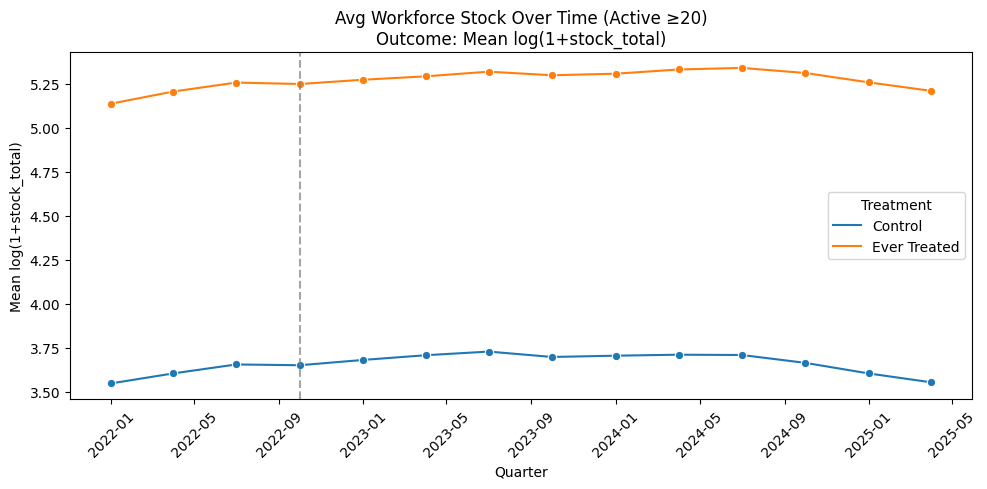

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

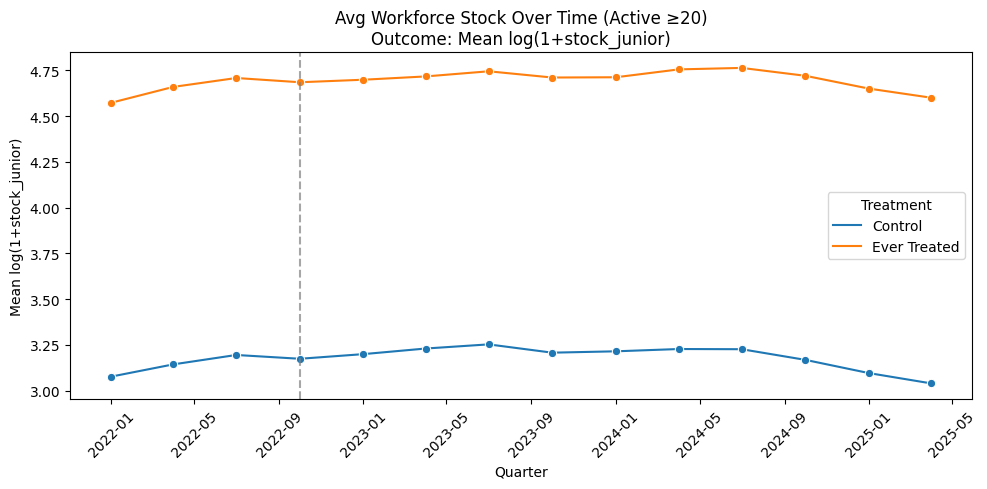

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

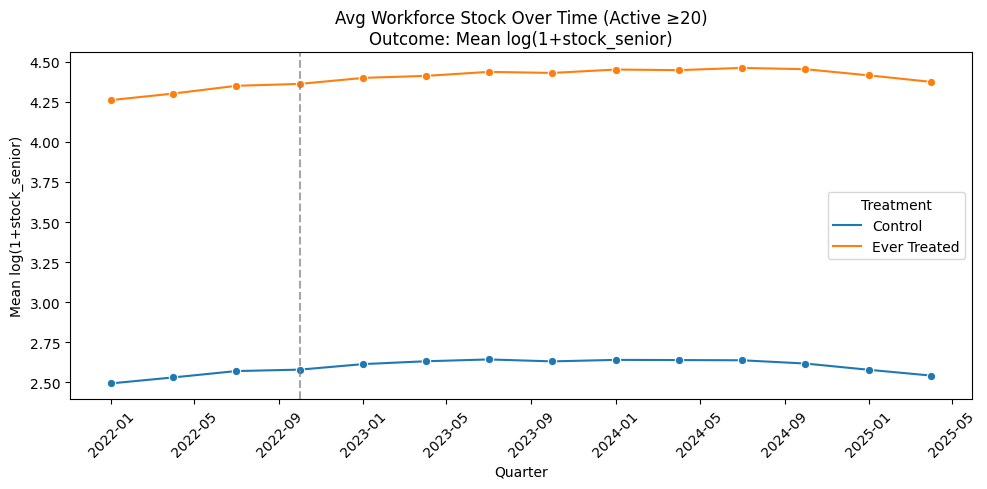

Saved panel: ../data/Positions/firm_quarter_stock_active_ge20_to2025Q2_with_seniority.dta | Rows: 127,176 | Firms: 9,084


In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import subprocess, sys

# pip install pyreadstat if not already installed
try:
    import pyreadstat
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "pyreadstat", "-q"])
    import pyreadstat


def build_stock_panel_for_threshold(
    positions_path=r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\Positions\positions_stock.csv",
    positions_2025_path=r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\Positions\2025_positions.csv",
    post1_path="../data/flagged_postings_gpt_predictions.csv",
    post2_path="../data/flagged_postings_gpt_predictions_2021Sep_Dec.csv",
    out_path_template="../data/Positions/firm_quarter_stock_active_ge{thr}_to2025Q2_with_seniority.dta",
    active_threshold=5,
    hire_window_start="2021-01-01",
    hire_window_end="2025-04-01",
    treated_start="2021-09-01",
    treated_end="2025-07-01",
    panel_start_q="2022Q1",
    panel_end_q="2025Q2",
    treat_q="2022Q4",
    recruitment_industries=None,
    make_plots=True,
):
    if recruitment_industries is None:
        recruitment_industries = [
            'Recruitment and Staffing Services',
            'Employment and Staffing Services',
            'Employment and Recruitment Services',
            'Human Resources and Recruitment Services',
            'Online Employment Platforms',
            'Human Resources and Workforce Solutions',
            'Business Process Outsourcing Services'
        ]

    # ---------------------------
    # 1) Load data
    # ---------------------------
    pos_main = pd.read_csv(positions_path)
    pos_2025 = pd.read_csv(positions_2025_path)
    positions = pd.concat([pos_main, pos_2025], ignore_index=True)

    post1 = pd.read_csv(post1_path)
    post2 = pd.read_csv(post2_path)
    postings_pred_df = pd.concat([post1, post2], ignore_index=True)

    # ---------------------------
    # 2) Ever-treated firms
    # ---------------------------
    postings_pred_df["post_date"] = pd.to_datetime(postings_pred_df["post_date"], errors="coerce")
    postings_pred_df["is_integrator_gpt"] = postings_pred_df["is_integrator_gpt"].astype(int)

    treated_firms = set(
        postings_pred_df[
            (postings_pred_df["is_integrator_gpt"] == 1) &
            (postings_pred_df["post_date"] >= treated_start) &
            (postings_pred_df["post_date"] < treated_end)
        ]["company"].astype(str).str.strip().str.lower().unique()
    )

    # ---------------------------
    # 3) Prepare positions + filters
    # ---------------------------
    positions["startdate"] = pd.to_datetime(positions["startdate"], errors="coerce")
    positions["enddate"] = pd.to_datetime(positions["enddate"], errors="coerce")
    positions["company_name"] = positions["company_name"].astype(str).str.strip().str.lower()
    positions = positions.dropna(subset=["company_name", "startdate", "user_id"])

    # Ensure seniority exists + numeric
    if "seniority" not in positions.columns:
        raise ValueError("Column 'seniority' not found in positions dataset.")
    positions["seniority"] = pd.to_numeric(positions["seniority"], errors="coerce")
    positions = positions.dropna(subset=["seniority"])
    positions["seniority"] = positions["seniority"].astype(int)

    # Create junior/senior indicator
    # Junior: 1-3, Senior: 4-7, else missing/other -> drop
    positions["is_junior"] = positions["seniority"].between(1, 3).astype(int)
    positions["is_senior"] = positions["seniority"].between(4, 7).astype(int)
    positions = positions[(positions["is_junior"] == 1) | (positions["is_senior"] == 1)].copy()

    # Exclude recruitment / intermediaries (drop entire firm if any row hits those industries)
    if "rics_k400" not in positions.columns:
        raise ValueError("Column 'rics_k400' not found in positions dataset.")
    bad_firms = positions.loc[positions["rics_k400"].isin(recruitment_industries), "company_name"].unique()
    positions = positions[~positions["company_name"].isin(bad_firms)].copy()

    # ---------------------------
    # 4) Define ACTIVE firms by hires in [2021-01-01, 2025-04-01)
    #    Using total hires across ALL seniority categories (recommended)
    # ---------------------------
    firm_hires = (
        positions[
            (positions["startdate"] >= hire_window_start) &
            (positions["startdate"] < hire_window_end)
        ]
        .groupby("company_name")["user_id"]
        .nunique()
        .reset_index(name="total_hires_2021_2025")
    )

    active_firms = set(
        firm_hires.loc[firm_hires["total_hires_2021_2025"] >= active_threshold, "company_name"]
    )
    positions = positions[positions["company_name"].isin(active_firms)].copy()

    # ---------------------------
    # 5) Build quarterly STOCK panel (balanced) for:
    #    - total
    #    - junior
    #    - senior
    # ---------------------------
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")

    stock_list = []
    for q in quarters:
        q_start = q.start_time
        q_end = q.end_time

        active = positions[
            (positions["startdate"] <= q_end) &
            (positions["enddate"].isna() | (positions["enddate"] >= q_start))
        ]

        # Total stock (unique workers)
        stock_total = (
            active.groupby("company_name")["user_id"]
            .nunique()
            .reset_index(name="stock_total")
        )

        # Junior stock
        stock_junior = (
            active.loc[active["is_junior"] == 1]
            .groupby("company_name")["user_id"]
            .nunique()
            .reset_index(name="stock_junior")
        )

        # Senior stock
        stock_senior = (
            active.loc[active["is_senior"] == 1]
            .groupby("company_name")["user_id"]
            .nunique()
            .reset_index(name="stock_senior")
        )

        # Merge within quarter
        stock = stock_total.merge(stock_junior, on="company_name", how="left") \
                          .merge(stock_senior, on="company_name", how="left")

        stock["stock_junior"] = stock["stock_junior"].fillna(0).astype(int)
        stock["stock_senior"] = stock["stock_senior"].fillna(0).astype(int)
        stock["quarter"] = q
        stock_list.append(stock)

    stock_panel = pd.concat(stock_list, ignore_index=True)

    # ---------------------------
    # 5.5 Balance panel (firm x quarter) and fill 0s
    # ---------------------------
    all_firms = positions[["company_name"]].drop_duplicates()
    all_q = pd.DataFrame({"quarter": quarters})
    all_firms["_tmp"] = 1
    all_q["_tmp"] = 1
    full = all_firms.merge(all_q, on="_tmp").drop(columns="_tmp")

    stock_panel = full.merge(stock_panel, on=["company_name", "quarter"], how="left")

    for c in ["stock_total", "stock_junior", "stock_senior"]:
        stock_panel[c] = stock_panel[c].fillna(0).astype(int)

    # ---------------------------
    # 6) Treatment + time vars + logs
    # ---------------------------
    stock_panel["treated"] = stock_panel["company_name"].isin(treated_firms).astype(int)
    stock_panel["Treatment"] = stock_panel["treated"].map({0: "Control", 1: "Ever Treated"})
    stock_panel["quarter_date"] = stock_panel["quarter"].dt.to_timestamp()

    stock_panel["log_stock_total"] = np.log1p(stock_panel["stock_total"])
    stock_panel["log_stock_junior"] = np.log1p(stock_panel["stock_junior"])
    stock_panel["log_stock_senior"] = np.log1p(stock_panel["stock_senior"])

    stock_panel["firm_id"] = stock_panel["company_name"].astype("category").cat.codes + 1
    stata_epoch = pd.Period("1960Q1", freq="Q")
    stock_panel["tq"] = stock_panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()

    # ---------------------------
    # 7) Optional plots (total + junior + senior)
    # ---------------------------
    if make_plots:
        for outcome, ylab in [
            ("log_stock_total", "Mean log(1+stock_total)"),
            ("log_stock_junior", "Mean log(1+stock_junior)"),
            ("log_stock_senior", "Mean log(1+stock_senior)")
        ]:
            plot_data = (
                stock_panel
                .groupby(["quarter_date", "Treatment"])[outcome]
                .mean()
                .reset_index()
            )
            plt.figure(figsize=(10, 5))
            sns.lineplot(data=plot_data, x="quarter_date", y=outcome, hue="Treatment", marker="o")
            plt.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            plt.title(f"Avg Workforce Stock Over Time (Active ≥{active_threshold})\nOutcome: {ylab}")
            plt.xlabel("Quarter")
            plt.ylabel(ylab)
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

    # ---------------------------
    # 8) Save to Stata (wide format with junior/senior)
    # ---------------------------
    stata_df = stock_panel[[
        "firm_id",
        "company_name",
        "tq",
        "treated",
        "stock_total",
        "stock_junior",
        "stock_senior",
        "log_stock_total",
        "log_stock_junior",
        "log_stock_senior"
    ]].copy()

    # Ensure types for Stata
    stata_df["firm_id"] = stata_df["firm_id"].astype(int)
    stata_df["tq"] = stata_df["tq"].astype(int)
    stata_df["treated"] = stata_df["treated"].astype(int)

    for c in ["stock_total", "stock_junior", "stock_senior",
              "log_stock_total", "log_stock_junior", "log_stock_senior"]:
        stata_df[c] = stata_df[c].astype(float)

    out_path = out_path_template.format(thr=active_threshold)
    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved panel: {out_path} | Rows: {len(stata_df):,} | Firms: {stata_df['firm_id'].nunique():,}")

    return stock_panel, stata_df


# -------------------------------------------------
# Run for multiple thresholds
# -------------------------------------------------
thresholds_to_test = [5, 10, 15, 20]

results = {}
for thr in thresholds_to_test:
    stock_panel, stata_df = build_stock_panel_for_threshold(
        active_threshold=thr,
        make_plots=True
    )
    results[thr] = stock_panel

In [19]:
stock_panel

,company_name,quarter,stock_total,stock_junior,stock_senior,treated,Treatment,quarter_date,log_stock_total,log_stock_junior,log_stock_senior,firm_id,tq
0,babilou family singapore,2022Q1,97,69,29,0,Control,2022-01-01,4.584967,4.248495,3.401197,859,248
1,babilou family singapore,2022Q2,95,67,29,0,Control,2022-04-01,4.564348,4.219508,3.401197,859,249
2,babilou family singapore,2022Q3,92,67,26,0,Control,2022-07-01,4.532599,4.219508,3.295837,859,250
3,babilou family singapore,2022Q4,92,66,27,0,Control,2022-10-01,4.532599,4.204693,3.332205,859,251
4,babilou family singapore,2023Q1,81,57,25,0,Control,2023-01-01,4.406719,4.060443,3.258097,859,252
...,...,...,...,...,...,...,...,...,...,...,...,...,...
127171,preschool market,2024Q2,10,8,2,0,Control,2024-04-01,2.397895,2.197225,1.098612,6060,257
127172,preschool market,2024Q3,10,7,3,0,Control,2024-07-01,2.397895,2.079442,1.386294,6060,258
127173,preschool market,2024Q4,9,7,2,0,Control,2024-10-01,2.302585,2.079442,1.098612,6060,259
127174,preschool market,2025Q1,7,5,2,0,Control,2025-01-01,2.079442,1.791759,1.098612,6060,260
